# Coursework 2 - Machine Learning - Question 1

Code realised by Robin Mathelier for the final coursework of Machine Learning module in MSc Statistics Imperial College London

## Libraries

In [3]:
import os

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline

import pandas as pd

import random

import numpy as np
import numpy.random as rd

from scipy.stats import reciprocal
from scipy.stats import spearmanr
from scipy.stats import mannwhitneyu

from statsmodels.stats.contingency_tables import mcnemar

from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import roc_curve
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow import keras

In [4]:
os.chdir(r"C:\Users\robin\Dropbox\Applications\Overleaf\Coursework 2 ML")
os.getcwd()

random.seed(42)

## Import data

In [5]:
data = pd.read_csv("CID1945214.csv")

In [6]:
data.shape

(1093, 29)

In [7]:
y = data['z']
X = data.iloc[:,1:]
X.shape, y.shape

((1093, 28), (1093,))

In [8]:
n = data.shape[0]
p = data.shape[1]
n, p

(1093, 29)

## Create training set and testing set

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.5, 
                                                    random_state=42,
                                                   shuffle = True)

print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(546, 28) (547, 28)
(546,) (547,)


# exploratory data analysis

In [10]:
data_train = pd.concat([pd.DataFrame(y_train), X_train], axis = 1)

In [11]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 546 entries, 395 to 860
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   z       546 non-null    int64  
 1   V2      545 non-null    float64
 2   V3      544 non-null    float64
 3   V4      544 non-null    float64
 4   V5      543 non-null    float64
 5   V6      545 non-null    float64
 6   V7      543 non-null    float64
 7   V8      544 non-null    float64
 8   V9      544 non-null    float64
 9   V10     544 non-null    float64
 10  V11     544 non-null    float64
 11  V12     544 non-null    float64
 12  V13     545 non-null    float64
 13  V14     543 non-null    float64
 14  V15     544 non-null    float64
 15  V16     544 non-null    float64
 16  V17     544 non-null    float64
 17  V18     545 non-null    float64
 18  V19     545 non-null    float64
 19  V20     545 non-null    float64
 20  V21     545 non-null    float64
 21  V22     545 non-null    float64
 22  

In [12]:
data_train.describe()

,z,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29
count,546.000000,545.000000,544.000000,544.000000,543.000000,545.000000,543.000000,544.000000,544.000000,544.000000,...,545.000000,545.000000,545.000000,546.000000,543.000000,544.000000,546.000000,544.000000,542.000000,543.000000
mean,0.518315,-42.799385,-40.855954,-29.098461,12.412523,-115.376752,38.968603,-9.339120,-1.430326,-5.079794,...,-21.834587,-32.626624,59.543872,5.876520,-21.979061,32.152647,-14.450421,13.310790,175.683007,-7.301179
std,0.500123,38.242131,33.955334,66.478261,122.980660,104.448320,60.465912,36.789729,109.606719,92.650346,...,186.607502,194.219746,196.215955,204.118325,201.349656,173.644987,182.281254,198.585411,255.338261,137.821939
min,0.000000,-131.400000,-124.300000,-255.500000,-240.000000,-428.600000,-143.400000,-79.880000,-292.100000,-347.900000,...,-337.580000,-366.880000,-305.200000,-339.470000,-364.960000,-268.040000,-324.940000,-334.260000,-247.560000,-249.180000
25%,0.000000,-70.540000,-66.752500,-69.280000,-90.000000,-195.700000,-2.783500,-34.790000,-71.290000,-69.040000,...,-190.380000,-214.580000,-96.830000,-175.355000,-187.600000,-119.017500,-170.497500,-150.525000,-53.465000,-127.035000
50%,1.000000,-46.690000,-46.150000,-25.280000,20.000000,-107.100000,32.630000,-19.025000,4.924500,0.973700,...,-20.520000,-22.190000,52.090000,-3.750000,-18.070000,34.300000,-13.590000,5.460000,172.930000,-0.050000
75%,1.000000,-6.526000,-8.428500,12.087500,120.000000,-30.300000,77.660000,7.072500,77.512500,59.217500,...,134.460000,138.080000,220.380000,185.887500,142.560000,186.710000,139.040000,165.587500,394.652500,111.135000
max,1.000000,59.230000,31.500000,169.600000,240.000000,95.240000,320.800000,159.900000,339.500000,229.700000,...,313.780000,303.160000,403.400000,363.290000,320.720000,330.910000,301.290000,388.910000,619.850000,232.980000


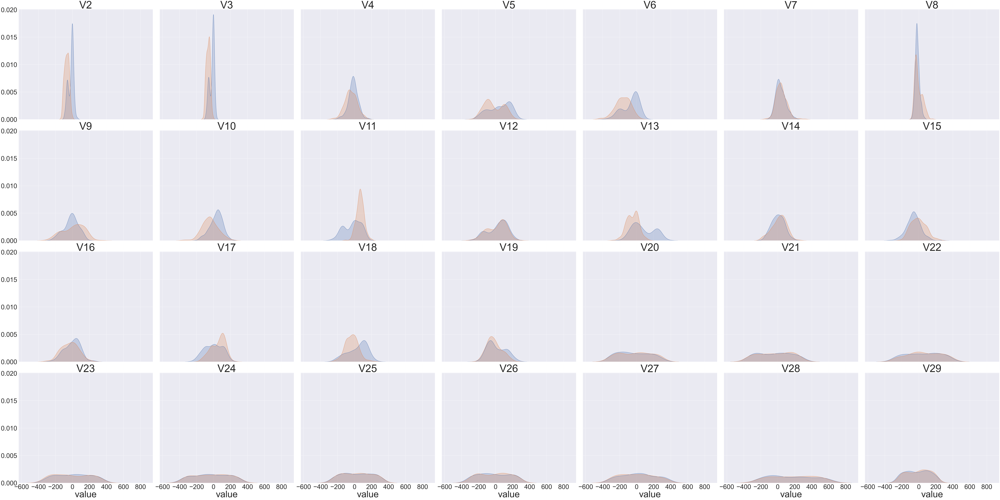

In [13]:
df = pd.melt(data_train, data_train.columns[0], data_train.columns[1:])

g = sns.FacetGrid(df, col="variable", hue="z", col_wrap=7, height = 15)
g.map(sns.kdeplot, "value", shade=True)
g.fig.subplots_adjust( top = 0.85 )
plt.subplots_adjust(hspace=0.1, wspace=0.05)
n = 0
for ax, title in zip(g.axes.flat, data_train.columns[1:]):
    ax.set_title(title, size = 80)
    ax.yaxis.set_tick_params(labelsize=50)
    if n > 20 :
        ax.set_xlabel("value", size = 70)
        ax.xaxis.set_tick_params(labelsize=50)
    n += 1
plt.show()
g.savefig("data_summary.pdf", bbox_inches='tight', dpi = 300)

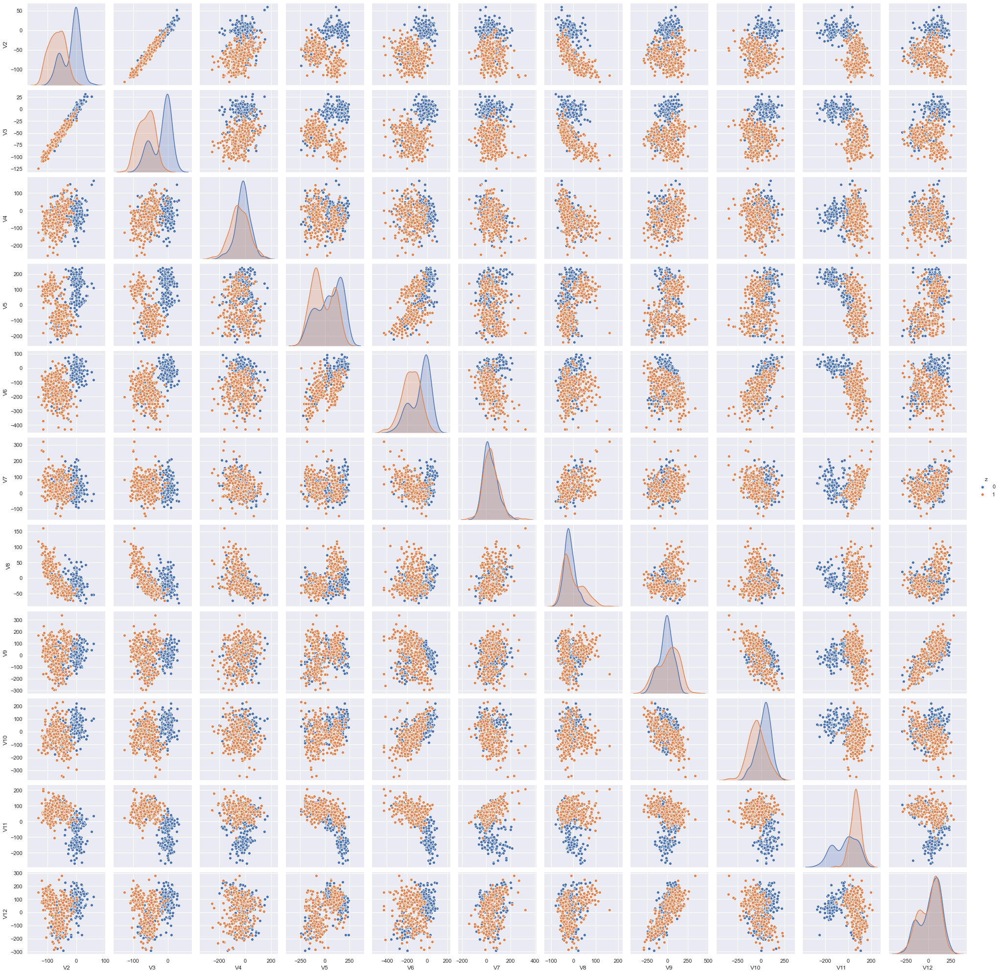

In [14]:
data_size = data_train.iloc[:,range(12)]
sns.pairplot(data_size, hue='z', height=2.5)

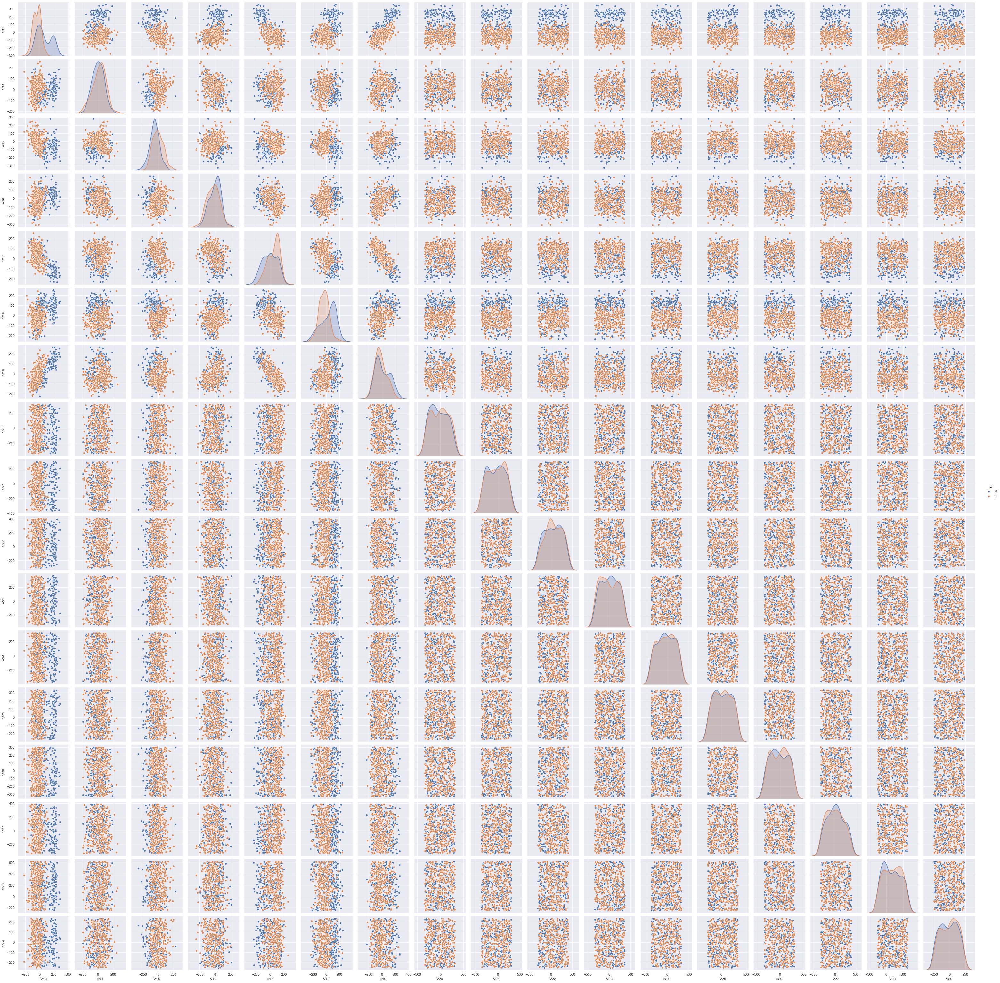

In [15]:
data_pattern = data_train.iloc[:,[0] + list(range(12,p))]
sns.pairplot(data_pattern, hue='z', height=2.5)

In [16]:
interesting_features = ['z','V2', 'V3', 'V5', 'V6', 'V11', 'V13', 'V17', 'V18', 'V20', 'V25']
data_int = data[interesting_features]

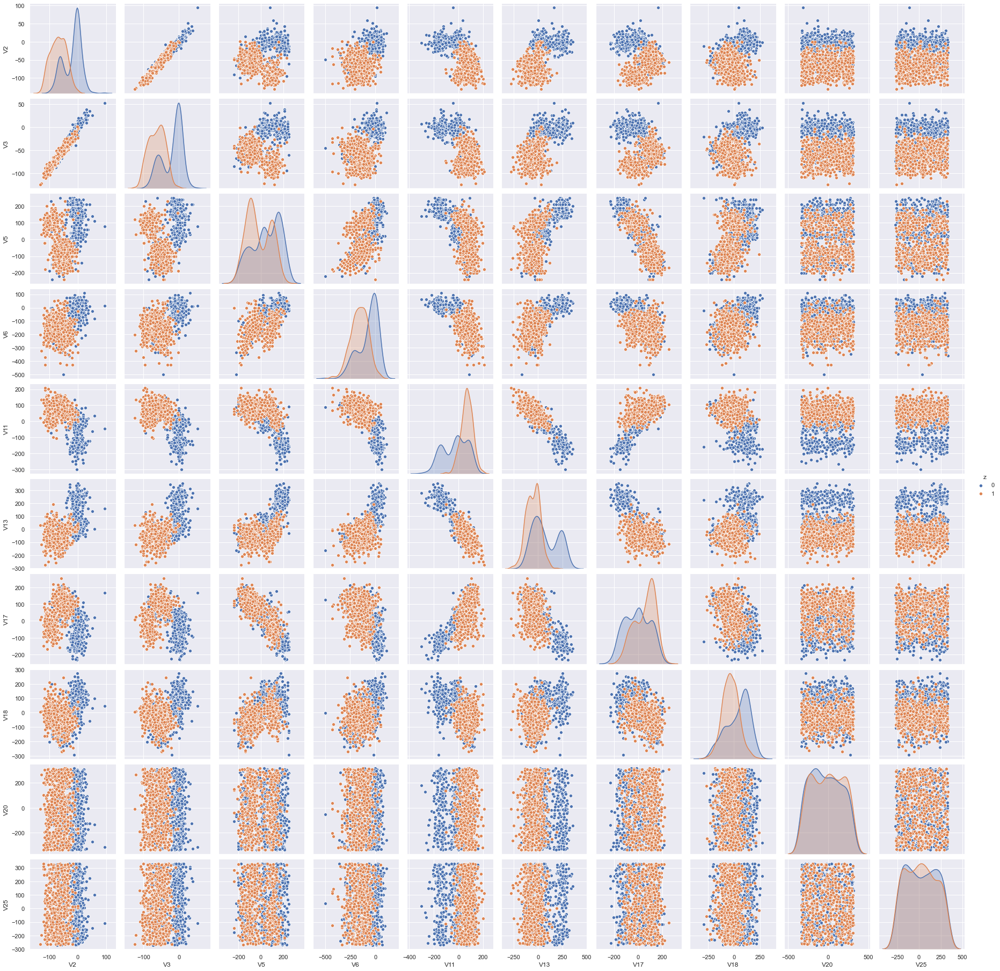

In [17]:
sns.pairplot(data_int, hue='z', height=2.5)

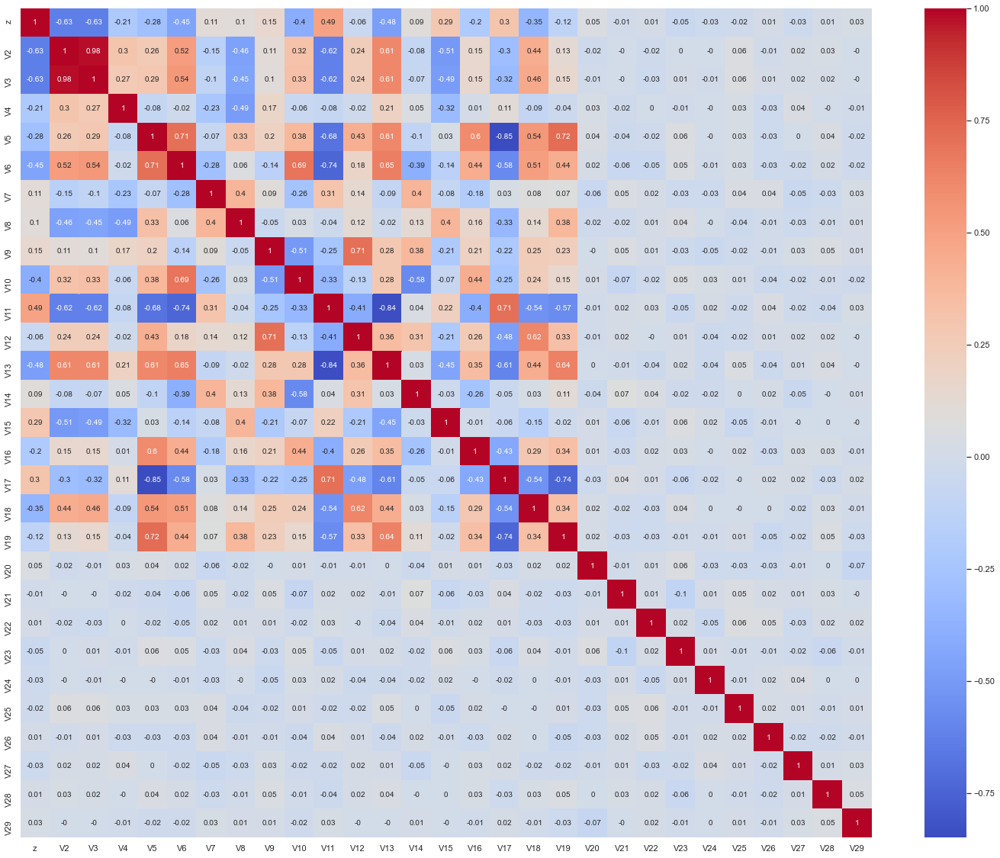

In [22]:
correlation_matrix = data.corr(method='spearman').round(2)
# annot = True to print the values inside the square
plt.subplots(figsize=(25,20))
sns.heatmap(data=correlation_matrix, annot=True, cmap= 'coolwarm')
plt.savefig("corr_matrix.pdf", bbox_inches='tight')

In [10]:
list_corr = []
for i in range(p-1):
    list_corr.append(("V"+str(i+2), abs(spearmanr(X_train.to_numpy()[:,i], y_train, nan_policy = 'omit')[0])))
def correl(M):
    return M[1]
sorted_corr = sorted(list_corr, key=correl, reverse = True)
sorted_corr

[('V2', 0.6426678770203269),
 ('V3', 0.6337014911261784),
 ('V13', 0.4833339153855862),
 ('V11', 0.4671352037750549),
 ('V6', 0.45825465112598596),
 ('V10', 0.404138715022222),
 ('V18', 0.3472925888027546),
 ('V15', 0.2986127542691637),
 ('V5', 0.2748460753378411),
 ('V17', 0.2699966561601146),
 ('V4', 0.21470877361476456),
 ('V16', 0.15749997820027906),
 ('V9', 0.14610272681096423),
 ('V19', 0.11885668519500786),
 ('V14', 0.1080871546038384),
 ('V8', 0.07146679302487546),
 ('V7', 0.05452920670708249),
 ('V20', 0.052922427835976386),
 ('V12', 0.050321291303775786),
 ('V23', 0.04984838638426888),
 ('V29', 0.04661840244943769),
 ('V27', 0.046508391795348096),
 ('V22', 0.04478859327585124),
 ('V28', 0.03677462906907906),
 ('V26', 0.0237439717454533),
 ('V24', 0.016646425448711186),
 ('V21', 0.014052302941567637),
 ('V25', 0.005821617379532176)]

In [11]:
label0 = y_train == 0
label1 = y_train == 1

X_train0 = X_train[label0].to_numpy()
X_train1 = X_train[label1].to_numpy()

list_pval = []
for i in range(p-1):
    list_pval.append(("V"+str(i+2), mannwhitneyu(X_train0[:,i], X_train1[:,i])[1]))
def correl(M):
    return M[1]
sorted_pval = sorted(list_pval, key=correl)
sorted_pval

[('V2', 0.0),
 ('V3', 0.0),
 ('V4', 0.0),
 ('V5', 0.0),
 ('V6', 0.0),
 ('V10', 0.0),
 ('V11', 0.0),
 ('V13', 0.0),
 ('V15', 0.0),
 ('V17', 0.0),
 ('V18', 0.0),
 ('V16', 0.0001),
 ('V9', 0.0004),
 ('V19', 0.0035),
 ('V14', 0.0079),
 ('V8', 0.036),
 ('V7', 0.0704),
 ('V20', 0.0964),
 ('V29', 0.0984),
 ('V12', 0.1207),
 ('V23', 0.1223),
 ('V22', 0.1329),
 ('V27', 0.1749),
 ('V28', 0.2465),
 ('V26', 0.2898),
 ('V24', 0.3263),
 ('V21', 0.4014),
 ('V25', 0.4485)]

## NA preprocessing

In [19]:
# number of columns with NA

print('NaN occurrences in Columns:')
cols_with_na = data_train.isna().sum(axis = 0)>=1
n_cols_with_na = cols_with_na.sum()
print(n_cols_with_na)

# number of rows with NA

print('NaN occurrences in Rows:')
rows_with_na = data_train.isna().sum(axis = 1)>=1
n_rows_with_na = rows_with_na.sum()
print(n_rows_with_na)

NaN occurrences in Columns:
26
NaN occurrences in Rows:
51


In [20]:
# Mean imputation

imp = SimpleImputer(missing_values=np.nan, strategy='median')
X_train = imp.fit_transform(X_train)
X_test = imp.transform(X_test)

In [21]:
sum(y_train == 0), sum(y_train == 1)

(263, 283)

## Random Forests

In [22]:
rf_clf_basic = RandomForestClassifier(random_state = 42)
rf_clf_basic.fit(X_train, y_train)
y_pred_rf_basic = rf_clf_basic.predict(X_test)
y_pred_train_rf_basic = rf_clf_basic.predict(X_train)

train_acc_rf_basic = accuracy_score(y_pred_train_rf_basic, y_train)
test_acc_rf_basic = accuracy_score(y_pred_rf_basic, y_test)
train_acc_rf_basic.round(4), test_acc_rf_basic.round(4)

(1.0, 0.9013)

## Random Forests with parameters tuning

In [92]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 2100, num = 10)]

# Number of features to consider at every split
max_features = [3, 5, 7, 10, 15, 20, 25]

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 150, num = 10)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
max_leaf_nodes = [1, 2, 5, 8, 11, 15]

# criterion
criterion = ['gini', 'entropy']

# min_samples_leaf
min_samples_leaf = [1, 2, 4, 8]

In [93]:
param_rf = {'n_estimators': n_estimators,
            'max_features': max_features,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'max_leaf_nodes' : max_leaf_nodes,
            'criterion' : criterion,
            'min_samples_leaf' : min_samples_leaf}

In [94]:
rf_clf = RandomForestClassifier(random_state = 42)
grid_search = RandomizedSearchCV(estimator = rf_clf, 
                                 param_distributions = param_rf, 
                                 n_iter = 300, 
                                 cv = 4, 
                                 random_state=42, 
                                 n_jobs = -1,
                                scoring = "accuracy")

grid_search.fit(X_train, y_train)

RandomizedSearchCV(cv=4, estimator=RandomForestClassifier(random_state=42),
                   n_iter=300, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 21, 37, 53, 69, 85,
                                                      101, 117, 133, 150,
                                                      None],
                                        'max_features': [3, 5, 7, 10, 15, 20,
                                                         25],
                                        'max_leaf_nodes': [1, 2, 5, 8, 11, 15],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 322, 544, 766,
                                                         988, 1211, 1433, 1655,
                                                         1877, 2100]},
 

In [95]:
grid_search.best_params_

{'n_estimators': 2100,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_leaf_nodes': 15,
 'max_features': 25,
 'max_depth': 133,
 'criterion': 'entropy'}

In [96]:
rf_clf_final = grid_search.best_estimator_

In [97]:
rf_clf_final.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=133, max_features=25,
                       max_leaf_nodes=15, n_estimators=2100, random_state=42)

In [98]:
y_pred_rf_final = rf_clf_final.predict(X_test)
y_pred_train_rf_final = rf_clf_final.predict(X_train)

In [99]:
train_acc_rf_final = accuracy_score(y_pred_train_rf_final, y_train)
test_acc_rf_final = accuracy_score(y_pred_rf_final, y_test)
train_acc_rf_final.round(4), test_acc_rf_final.round(4)

(0.989, 0.9141)

### Features importance - Random Forest

In [31]:
feature_list = list(data.iloc[:,1:].columns)
importances = list(rf_clf_final.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 3)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
feature_importances

[('V3', 0.408),
 ('V12', 0.094),
 ('V2', 0.084),
 ('V14', 0.065),
 ('V6', 0.049),
 ('V5', 0.041),
 ('V13', 0.04),
 ('V8', 0.034),
 ('V9', 0.028),
 ('V4', 0.026),
 ('V16', 0.02),
 ('V10', 0.015),
 ('V18', 0.013),
 ('V17', 0.011),
 ('V11', 0.01),
 ('V15', 0.009),
 ('V19', 0.007),
 ('V29', 0.007),
 ('V7', 0.006),
 ('V20', 0.005),
 ('V25', 0.005),
 ('V23', 0.004),
 ('V24', 0.004),
 ('V26', 0.004),
 ('V27', 0.004),
 ('V28', 0.004),
 ('V21', 0.003),
 ('V22', 0.003)]

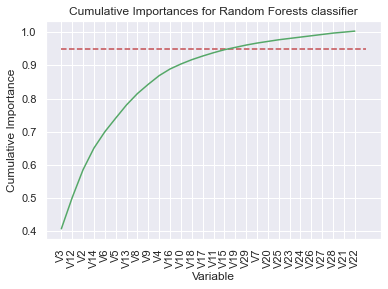

In [32]:
x_values = list(range(len(importances)))

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]
# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)
# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')
# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')
# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')
# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances for Random Forests classifier')
plt.savefig("importance_variables_RF1.pdf", bbox_inches='tight')

In [33]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 17


# MLP

## Create features MLP

In [34]:
random.seed(42)

In [35]:
scaler = StandardScaler()
X_train_mlp = scaler.fit_transform(X_train)
X_test_mlp = scaler.transform(X_test)
y_train_mlp = np.array(y_train).reshape(-1,1)

## MLP

In [36]:
def build_model(n_hidden = 0, n_neurons = 30, learning_rate = 3e-2, input_shape = [p-1]) :
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape = input_shape))
    for layer in range(n_hidden) :
        model.add(keras.layers.Dense(n_neurons))
    model.add(keras.layers.Dense(1, activation = "tanh"))
    optimizer = keras.optimizers.SGD(lr = learning_rate)
    model.compile(loss = "binary_crossentropy", optimizer = optimizer, metrics = "accuracy")
    return model

In [37]:
keras_clf = keras.wrappers.scikit_learn.KerasClassifier(build_model)

In [38]:
tf.random.set_seed(42)

keras_clf.fit(X_train_mlp[50:], 
              y_train_mlp[50:], 
              validation_data=(X_train_mlp[:50], y_train_mlp[:50]), 
              epochs=1000, 
              callbacks=[keras.callbacks.EarlyStopping(patience=10)])

Epoch 1/1000
16/16 [==============================] - 1s 55ms/step - loss: 2.8640 - accuracy: 0.6835 - val_loss: 1.6061 - val_accuracy: 0.8000
Epoch 2/1000
16/16 [==============================] - 0s 8ms/step - loss: 2.4656 - accuracy: 0.7238 - val_loss: 1.5606 - val_accuracy: 0.8000
Epoch 3/1000
16/16 [==============================] - 0s 7ms/step - loss: 2.1635 - accuracy: 0.7480 - val_loss: 1.5388 - val_accuracy: 0.8400
Epoch 4/1000
16/16 [==============================] - 0s 7ms/step - loss: 1.9036 - accuracy: 0.7661 - val_loss: 1.5288 - val_accuracy: 0.8400
Epoch 5/1000
16/16 [==============================] - 0s 4ms/step - loss: 1.7588 - accuracy: 0.7802 - val_loss: 1.2805 - val_accuracy: 0.8200
Epoch 6/1000
16/16 [==============================] - 0s 7ms/step - loss: 1.6965 - accuracy: 0.7863 - val_loss: 1.2412 - val_accuracy: 0.8200
Epoch 7/1000
16/16 [==============================] - 0s 6ms/step - loss: 1.5932 - accuracy: 0.7903 - val_loss: 1.2543 - val_accuracy: 0.8400
Epoch

In [39]:
y_pred_mlp = keras_clf.predict(X_test_mlp)
y_pred_train_mlp = keras_clf.predict(X_train_mlp)

train_acc_mlp = accuracy_score(y_pred_train_mlp, y_train_mlp)
test_acc_mlp = accuracy_score(y_pred_mlp, y_test)
train_acc_mlp, test_acc_mlp

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


(0.793040293040293, 0.7586837294332724)

## MLP with parameters tuning

In [40]:
def auroc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

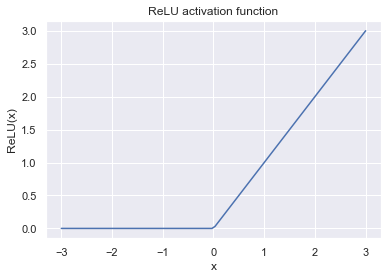

In [41]:
def relu(x):
    return tf.keras.activations.relu(x)
x = np.linspace(-3,3,100)
ax = plt.gca()  # or any other way to get an axis object
ax.plot(x, relu(x))
ax.set_xlabel("x")
ax.set_ylabel("ReLU(x)")
ax.set_title("ReLU activation function")
plt.savefig("ReLU.pdf", bbox_inches='tight')

In [42]:
def build_model_tuned(n_hidden = 1, n_neurons = 50, dropout_rate = 0.3, l2_coeff = 1e-2, input_shape = [p-1]) :
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape = input_shape))
    for layer in range(n_hidden) :
        model.add(keras.layers.Dense(n_neurons, kernel_regularizer = tf.keras.regularizers.l2(l2_coeff), activation = 'relu'))
        model.add(keras.layers.Dropout(rate = dropout_rate))
    model.add(keras.layers.Dense(1, activation = "sigmoid"))
    return model

In [43]:
tf.random.set_seed(42)
mlp_tuned = build_model_tuned()
mlp_tuned.compile(loss = "BinaryCrossentropy", optimizer = tf.keras.optimizers.SGD(learning_rate = 0.005), metrics = "accuracy")

In [44]:
X_valid_mlp, y_valid_mlp = X_train_mlp[:50,], y_train_mlp[:50,]
X_train_mlp, y_train_mlp = X_train_mlp[50:,], y_train_mlp[50:,]
X_train_mlp.shape, X_valid_mlp.shape

((496, 28), (50, 28))

In [45]:
history = mlp_tuned.fit(X_train_mlp,
              y_train_mlp, 
              validation_data=(X_valid_mlp, y_valid_mlp), 
              epochs=5000, 
              callbacks=[keras.callbacks.EarlyStopping(patience=50, monitor = 'val_loss')])

Epoch 1/5000
16/16 [==============================] - 1s 39ms/step - loss: 1.1943 - accuracy: 0.4919 - val_loss: 1.1412 - val_accuracy: 0.5000
Epoch 2/5000
16/16 [==============================] - 0s 6ms/step - loss: 1.1370 - accuracy: 0.5202 - val_loss: 1.0811 - val_accuracy: 0.5200
Epoch 3/5000
16/16 [==============================] - 0s 4ms/step - loss: 1.1082 - accuracy: 0.5161 - val_loss: 1.0289 - val_accuracy: 0.5600
Epoch 4/5000
16/16 [==============================] - 0s 5ms/step - loss: 1.0619 - accuracy: 0.5565 - val_loss: 0.9890 - val_accuracy: 0.6200
Epoch 5/5000
16/16 [==============================] - 0s 6ms/step - loss: 1.0227 - accuracy: 0.6008 - val_loss: 0.9568 - val_accuracy: 0.7000
Epoch 6/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.9781 - accuracy: 0.6472 - val_loss: 0.9300 - val_accuracy: 0.7800
Epoch 7/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.9786 - accuracy: 0.6452 - val_loss: 0.9063 - val_accuracy: 0.7800
Epoch

Epoch 115/5000
16/16 [==============================] - ETA: 0s - loss: 0.6949 - accuracy: 0.81 - 0s 6ms/step - loss: 0.5170 - accuracy: 0.8992 - val_loss: 0.5556 - val_accuracy: 0.8600
Epoch 116/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.5214 - accuracy: 0.8952 - val_loss: 0.5544 - val_accuracy: 0.8600
Epoch 117/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.5312 - accuracy: 0.8750 - val_loss: 0.5533 - val_accuracy: 0.8600
Epoch 118/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.5141 - accuracy: 0.8931 - val_loss: 0.5520 - val_accuracy: 0.8600
Epoch 119/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.5213 - accuracy: 0.8972 - val_loss: 0.5509 - val_accuracy: 0.8600
Epoch 120/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.5043 - accuracy: 0.9012 - val_loss: 0.5499 - val_accuracy: 0.8600
Epoch 121/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.5089 - accuracy:

Epoch 228/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.3884 - accuracy: 0.9214 - val_loss: 0.4667 - val_accuracy: 0.8800
Epoch 229/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.3842 - accuracy: 0.9335 - val_loss: 0.4663 - val_accuracy: 0.8800
Epoch 230/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.4015 - accuracy: 0.9113 - val_loss: 0.4658 - val_accuracy: 0.8800
Epoch 231/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.3926 - accuracy: 0.9234 - val_loss: 0.4654 - val_accuracy: 0.8800
Epoch 232/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3898 - accuracy: 0.9254 - val_loss: 0.4649 - val_accuracy: 0.8800
Epoch 233/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3959 - accuracy: 0.9254 - val_loss: 0.4645 - val_accuracy: 0.8800
Epoch 234/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.3957 - accuracy: 0.9173 - val_loss: 0.4638 - val_accuracy:

Epoch 285/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.3482 - accuracy: 0.9415 - val_loss: 0.4390 - val_accuracy: 0.8800
Epoch 286/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.3479 - accuracy: 0.9335 - val_loss: 0.4387 - val_accuracy: 0.8800
Epoch 287/5000
16/16 [==============================] - 0s 2ms/step - loss: 0.3499 - accuracy: 0.9456 - val_loss: 0.4383 - val_accuracy: 0.8800
Epoch 288/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.3527 - accuracy: 0.9254 - val_loss: 0.4380 - val_accuracy: 0.8800
Epoch 289/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.3523 - accuracy: 0.9274 - val_loss: 0.4374 - val_accuracy: 0.8800
Epoch 290/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.3555 - accuracy: 0.9294 - val_loss: 0.4370 - val_accuracy: 0.8800
Epoch 291/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.3472 - accuracy: 0.9415 - val_loss: 0.4365 - val_accuracy:

Epoch 342/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.3169 - accuracy: 0.9456 - val_loss: 0.4158 - val_accuracy: 0.8800
Epoch 343/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.3259 - accuracy: 0.9435 - val_loss: 0.4155 - val_accuracy: 0.8800
Epoch 344/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.3245 - accuracy: 0.9456 - val_loss: 0.4152 - val_accuracy: 0.8800
Epoch 345/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.3115 - accuracy: 0.9516 - val_loss: 0.4149 - val_accuracy: 0.8800
Epoch 346/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.3205 - accuracy: 0.9375 - val_loss: 0.4146 - val_accuracy: 0.8800
Epoch 347/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.3128 - accuracy: 0.9476 - val_loss: 0.4143 - val_accuracy: 0.8800
Epoch 348/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.3223 - accuracy: 0.9415 - val_loss: 0.4140 - val_accuracy:

Epoch 399/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2999 - accuracy: 0.9395 - val_loss: 0.3972 - val_accuracy: 0.8800
Epoch 400/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2915 - accuracy: 0.9476 - val_loss: 0.3968 - val_accuracy: 0.8800
Epoch 401/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2954 - accuracy: 0.9415 - val_loss: 0.3965 - val_accuracy: 0.8800
Epoch 402/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2754 - accuracy: 0.9617 - val_loss: 0.3964 - val_accuracy: 0.8800
Epoch 403/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2771 - accuracy: 0.9677 - val_loss: 0.3965 - val_accuracy: 0.8800
Epoch 404/5000
16/16 [==============================] - 0s 4ms/step - loss: 0.2884 - accuracy: 0.9395 - val_loss: 0.3964 - val_accuracy: 0.8800
Epoch 405/5000
16/16 [==============================] - 0s 9ms/step - loss: 0.2807 - accuracy: 0.9577 - val_loss: 0.3960 - val_accuracy:

Epoch 456/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2706 - accuracy: 0.9577 - val_loss: 0.3826 - val_accuracy: 0.8800
Epoch 457/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2616 - accuracy: 0.9657 - val_loss: 0.3825 - val_accuracy: 0.8800
Epoch 458/5000
16/16 [==============================] - 0s 8ms/step - loss: 0.2605 - accuracy: 0.9536 - val_loss: 0.3824 - val_accuracy: 0.8800
Epoch 459/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2609 - accuracy: 0.9577 - val_loss: 0.3821 - val_accuracy: 0.8800
Epoch 460/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2643 - accuracy: 0.9536 - val_loss: 0.3815 - val_accuracy: 0.8800
Epoch 461/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2648 - accuracy: 0.9536 - val_loss: 0.3814 - val_accuracy: 0.8800
Epoch 462/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2596 - accuracy: 0.9637 - val_loss: 0.3813 - val_accuracy:

Epoch 513/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2533 - accuracy: 0.9556 - val_loss: 0.3732 - val_accuracy: 0.8800
Epoch 514/5000
16/16 [==============================] - 0s 8ms/step - loss: 0.2429 - accuracy: 0.9597 - val_loss: 0.3732 - val_accuracy: 0.8800
Epoch 515/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2465 - accuracy: 0.9597 - val_loss: 0.3727 - val_accuracy: 0.8800
Epoch 516/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2481 - accuracy: 0.9657 - val_loss: 0.3728 - val_accuracy: 0.8800
Epoch 517/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2503 - accuracy: 0.9577 - val_loss: 0.3727 - val_accuracy: 0.8800
Epoch 518/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2448 - accuracy: 0.9496 - val_loss: 0.3722 - val_accuracy: 0.8800
Epoch 519/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2452 - accuracy: 0.9556 - val_loss: 0.3720 - val_accuracy:

Epoch 570/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2305 - accuracy: 0.9556 - val_loss: 0.3671 - val_accuracy: 0.8800
Epoch 571/5000
16/16 [==============================] - 0s 9ms/step - loss: 0.2324 - accuracy: 0.9677 - val_loss: 0.3670 - val_accuracy: 0.8800
Epoch 572/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2328 - accuracy: 0.9617 - val_loss: 0.3669 - val_accuracy: 0.8800
Epoch 573/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.2271 - accuracy: 0.9677 - val_loss: 0.3668 - val_accuracy: 0.8800
Epoch 574/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2222 - accuracy: 0.9758 - val_loss: 0.3671 - val_accuracy: 0.8800
Epoch 575/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2283 - accuracy: 0.9738 - val_loss: 0.3668 - val_accuracy: 0.8800
Epoch 576/5000
16/16 [==============================] - 0s 11ms/step - loss: 0.2253 - accuracy: 0.9758 - val_loss: 0.3666 - val_accuracy

Epoch 627/5000
16/16 [==============================] - 0s 8ms/step - loss: 0.2166 - accuracy: 0.9677 - val_loss: 0.3620 - val_accuracy: 0.8800
Epoch 628/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2148 - accuracy: 0.9718 - val_loss: 0.3621 - val_accuracy: 0.8800
Epoch 629/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2088 - accuracy: 0.9657 - val_loss: 0.3621 - val_accuracy: 0.8800
Epoch 630/5000
16/16 [==============================] - 0s 8ms/step - loss: 0.2117 - accuracy: 0.9698 - val_loss: 0.3622 - val_accuracy: 0.8800
Epoch 631/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2139 - accuracy: 0.9657 - val_loss: 0.3622 - val_accuracy: 0.8800
Epoch 632/5000
16/16 [==============================] - ETA: 0s - loss: 0.2103 - accuracy: 0.96 - 0s 10ms/step - loss: 0.2199 - accuracy: 0.9617 - val_loss: 0.3622 - val_accuracy: 0.8800
Epoch 633/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2211 - accuracy

Epoch 740/5000
16/16 [==============================] - 0s 6ms/step - loss: 0.1926 - accuracy: 0.9738 - val_loss: 0.3519 - val_accuracy: 0.8800
Epoch 741/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2072 - accuracy: 0.9738 - val_loss: 0.3515 - val_accuracy: 0.8800
Epoch 742/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2027 - accuracy: 0.9577 - val_loss: 0.3514 - val_accuracy: 0.8800
Epoch 743/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.1974 - accuracy: 0.9637 - val_loss: 0.3513 - val_accuracy: 0.8800
Epoch 744/5000
16/16 [==============================] - 0s 7ms/step - loss: 0.2007 - accuracy: 0.9637 - val_loss: 0.3517 - val_accuracy: 0.8800
Epoch 745/5000
16/16 [==============================] - 0s 5ms/step - loss: 0.2101 - accuracy: 0.9435 - val_loss: 0.3515 - val_accuracy: 0.8800
Epoch 746/5000
16/16 [==============================] - 0s 8ms/step - loss: 0.1873 - accuracy: 0.9718 - val_loss: 0.3513 - val_accuracy:

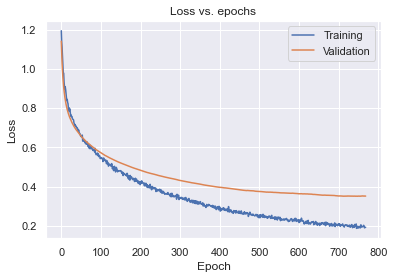

In [46]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss vs. epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper right')
plt.savefig("loss_MLP.pdf", bbox_inches='tight')

In [47]:
y_pred_train_mlp_final = mlp_tuned.predict_classes(X_train_mlp)
train_acc_mlp = accuracy_score(y_pred_train_mlp_final, y_train_mlp)
train_acc_mlp.round(4)

0.9839

In [48]:
y_pred_valid_mlp_final = mlp_tuned.predict_classes(X_valid_mlp)
valid_acc_mlp = accuracy_score(y_pred_valid_mlp_final, y_valid_mlp)
valid_acc_mlp

0.88

In [49]:
y_pred_mlp_final = mlp_tuned.predict_classes(X_test_mlp)
test_acc_mlp = accuracy_score(y_pred_mlp_final, y_test)
test_acc_mlp.round(4)

0.9122

# Comparison Random Forest and MLP

In [50]:
y_pred_rf = y_pred_rf_final
y_pred_mlp = y_pred_mlp_final.reshape(547,)

In [51]:
confusion_matrix(y_test, y_pred_rf)

array([[252,  42],
       [  5, 248]], dtype=int64)

In [52]:
confusion_matrix(y_test, y_pred_mlp)

array([[260,  34],
       [ 14, 239]], dtype=int64)

# McNemar’s test

In [53]:
rf_cor = (y_pred_rf == y_test)
rf_err = (y_pred_rf != y_test)
mlp_cor = (y_pred_mlp == y_test)
mlp_err = (y_pred_mlp != y_test)

In [54]:
rf_cor_mlp_cor = np.logical_and(rf_cor,mlp_cor).sum()
rf_cor_mlp_err = np.logical_and(rf_cor,mlp_err).sum()
rf_err_mlp_cor = np.logical_and(rf_err,mlp_cor).sum()
rf_err_mlp_err = np.logical_and(rf_err,mlp_err).sum()

In [55]:
table = [[rf_cor_mlp_cor, rf_cor_mlp_err], 
         [rf_err_mlp_cor, rf_err_mlp_err]]

In [56]:
print(np.array(table))

[[484  16]
 [ 15  32]]


### Test with continuity correction

In [57]:
mcnemar_cont = mcnemar(table, exact=False, correction=True)

In [58]:
print('statistic=%.2f, p-value=%.7f' % (mcnemar_cont.statistic, mcnemar_cont.pvalue))
# interpret the p-value
alpha = 0.05
if mcnemar_cont.pvalue > alpha:
    print('Same proportions of errors (fail to reject H0)')
else:
    print('Different proportions of errors (reject H0)')

statistic=0.00, p-value=1.0000000
Same proportions of errors (fail to reject H0)


### Exact test

In [59]:
mcnemar_exact = mcnemar(table, exact=True)

In [60]:
print('statistic=%.3f, p-value=%.3f' % (mcnemar_exact.statistic, mcnemar_exact.pvalue))
# interpret the p-value
alpha = 0.05
if mcnemar_exact.pvalue > alpha:
    print('Same proportions of errors (fail to reject H0)')
else:
    print('Different proportions of errors (reject H0)')

statistic=15.000, p-value=1.000
Same proportions of errors (fail to reject H0)


### ROC

In [61]:
y_pred_mlp_roc = mlp_tuned.predict(X_test_mlp)
fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test, y_pred_mlp_roc)

In [62]:
from sklearn.metrics import auc
auc_keras = auc(fpr_keras, tpr_keras)

<Figure size 432x288 with 0 Axes>

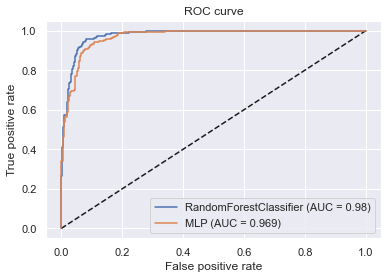

In [63]:
plt.figure(1)
plot_roc_curve(rf_clf_final, X_test, y_test)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_keras, tpr_keras, label='MLP (AUC = {:.3f})'.format(auc_keras))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.savefig("roc_curve.pdf", bbox_inches='tight')

# Reject option

## Random forest

In [64]:
y_proba_rf = rf_clf_final.predict_proba(X_test)
A_rf = np.where(y_proba_rf >= 0.6)[0]

In [65]:
print('number of test observations :', X_test.shape[0])
print('number of test observations accepted :', A_rf.shape[0])
print('number of test observations rejected :', X_test.shape[0] - A_rf.shape[0])

number of test observations : 547
number of test observations accepted : 503
number of test observations rejected : 44


In [66]:
X_test_A_rf = X_test[A_rf,:]
y_test_A_rf = y_test.values.reshape(-1,1)[A_rf,:]
X_test_A_rf.shape, y_test_A_rf.shape

((503, 28), (503, 1))

In [67]:
y_pred_rf_A = rf_clf_final.predict(X_test_A_rf)

In [68]:
accuracy_score(y_pred_rf_A, y_test_A_rf).round(4)

0.9463

In [69]:
confusion_matrix(y_test_A_rf, y_pred_rf_A), confusion_matrix(y_test, y_pred_rf)

(array([[234,  24],
        [  3, 242]], dtype=int64),
 array([[252,  42],
        [  5, 248]], dtype=int64))

## MLP

In [70]:
y_proba_mlp = mlp_tuned.predict(X_test_mlp)
A_mlp = np.where(abs(y_proba_mlp - 0.5) >= 0.1)[0]

In [71]:
print('number of test observations :', X_test_mlp.shape[0])
print('number of test observations accepted :', A_mlp.shape[0])
print('number of test observations rejected :', X_test_mlp.shape[0] - A_mlp.shape[0])

number of test observations : 547
number of test observations accepted : 518
number of test observations rejected : 29


In [72]:
X_test_A_mlp = X_test_mlp[A_mlp,:]
y_test_A_mlp = y_test.values.reshape(-1,1)[A_mlp,:]
X_test_A_mlp.shape, y_test_A_mlp.shape

((518, 28), (518, 1))

In [73]:
y_pred_mlp_A = mlp_tuned.predict_classes(X_test_A_mlp)

In [74]:
accuracy_score(y_pred_mlp_A, y_test_A_mlp)

0.9285714285714286

In [75]:
confusion_matrix(y_test_A_mlp, y_pred_mlp_A), confusion_matrix(y_test, y_pred_mlp)

(array([[249,  27],
        [ 10, 232]], dtype=int64),
 array([[260,  34],
        [ 14, 239]], dtype=int64))